<a href="https://colab.research.google.com/github/FayK12/PythonRepo/blob/master/CartoonEffect.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow #displays an img in a window
from google.colab import files #local drive upload

In [2]:
#load image into colab
def load_file(fileN):
  #read img in default mode 
  #gives color code of BGR to img
  img = cv2.imread(fileN) 
  cv2_imshow(img)
  return img


Saving hero.jpg to hero.jpg


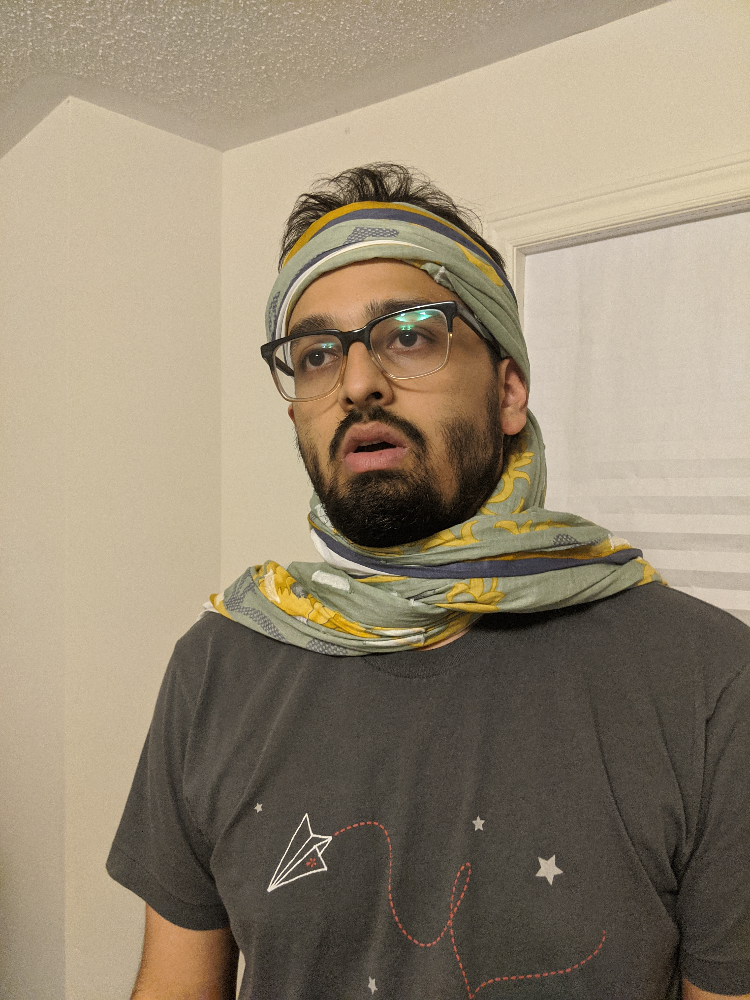

In [3]:
uploaded = files.upload()
fileN = next(iter(uploaded))
img = load_file(fileN)


In [4]:
#reduce noise of blurred grayscale img using medianBlur, apply adaptiveThreshold, 
#define line size of edge (larger line size = thicker edges emphasized)
def edge_mask(img, line_size, blur_value):
  #transform img to grayscale
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

  #one of a few blur techniques
  gray_blur = cv2.medianBlur(gray, blur_value)

  #cv2.adaptiveThreshold(source, maxVal, adaptiveMethod, thresholdType, blocksize, constant)
  #THRESH_BINARY sets pixels to black (0) or white (1) based on their value being below or above maxVal
  
  edges = cv2.adaptiveThreshold(gray_blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 5, blur_value)
  return edges


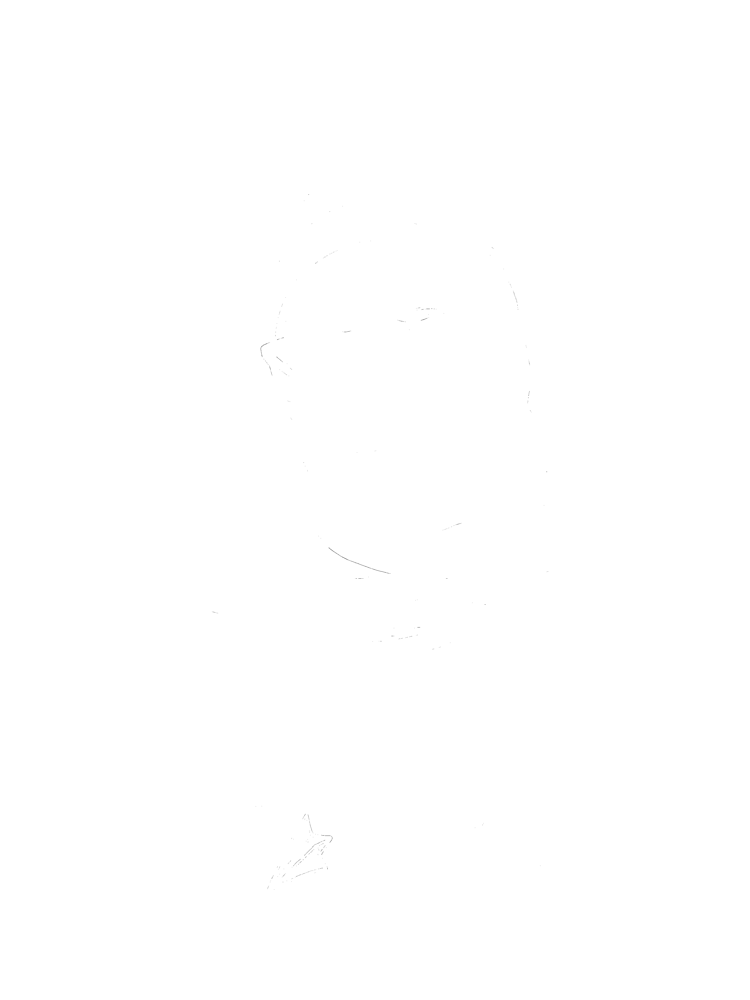

In [5]:
#blur_value (or kernel size) must be positive and odd
edges = edge_mask(img, line_size=7, blur_value=13)
cv2_imshow(edges)


In [6]:
#reduce num of colour in photo for drawing (color quantization) using k-means clustering algorithm
#https://docs.opencv.org/master/d1/d5c/tutorial_py_kmeans_opencv.html
def color_quantization(img, k):
  #transform img for cv2.kmeans
  data = np.float32(img).reshape((-1,3))
  criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 20, 0.001)

  #implement k-means
  #data must be in np.float32 format
  ret, label, center = cv2.kmeans(data, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

  #convert back into uint8 and make the original image
  center = np.uint8(center)
  result = center[label.flatten()]
  result = result.reshape(img.shape)

  return result


In [7]:
img = color_quantization(img, total_color=9)
cv2_imshow(img)

TypeError: ignored

In [ ]:
#use bilat filter to reduce noise in img, smooth it, and most importantly, preserve edges
# sigmaColor: Value of \sigma in the color space. The greater the value, the colors farther to 
#             each other will start to get mixed.
blurred = cv2.bilateralFilter(img, d=7, sigmaColor=200, sigmaSpace=200)
#cv2_imshow(blurred)

In [ ]:
#combo of edge mask and color processed img
cartoon = cv2.bitwise_and(blurred, blurred, mask=edges)
cv2_imshow(cartoon)